<a href="https://colab.research.google.com/github/jambinoid/convolution_networks/blob/master/architectures.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

В данном задании мы познакомимся с архитектурами *AlexNet*, *VGG* и *Inception* и для каждой из этих моделей будем использовать технику **Transfer Learning**.  

* **Transfer Learning** - это процесс дообучения на **новых данных** какой-либо нейросети, уже обученной до этого на других данных, обычно на каком-нибудь хорошем, большом (миллионы картинок) датасете (например, [ImageNet](http://www.image-net.org/) ~ 14 млн картинок).

<h2 style="text-align: center;"><b>AlexNet</b></h2>

**AlexNet** - нейронная сеть, которая победила в ILSVRC (соревнование по классификации картинок из ImageNet) в 2012 году и стала основой для многих других архитектур. Впервые она была представлена в статье  “ImageNet Classification with Deep Convolutional Neural Networks”, над которой работал Джоффри Хинтон - человек, которого многие называют отцом современного computer vision.

Архитектура описана на картинке ниже

<img src="https://www.learnopencv.com/wp-content/uploads/2018/05/AlexNet-1.png">

**AlexNet** состоит из 5 **сверточных** слоев, 3 **MaxPool** слоев и 2 **FullyConnected** слоев в конце. Обратите внимание, что в последнем пулинг слое окна, из которых берется максимум, пересекаются за счет того, что *stride*=2. Это изменение по сравнению с традиционным пулингом помогло снизить ошибку на 0.4%.

По сути **AlexNet** это самая базовая архитектура для сверточной сети после LeNet.

<h2 style="text-align: center;"><b>VGG</b></h3>

Один **сверточный** слой с фильтром 5$\times$5 можно заменить двумя подряд идущими слоями с фильтрами размером 3$\times$3, так как **воспринимаемая область** картинки у них будет одинаковой. При этом уменьшиться количество параметров, поэтому такую сеть будет легче обучать. 

На момент создания VGG люди уже заметили, что чем больше слоев в нейросети, тем выше ее точность. Заменяя большие фильтры на несколько фильтров 3$\times$3 исследователи получили глубокую нейросеть с меньшим количеством параметров. Архитектура VGG-16 (версии VGG с 16 слоями) представлена на картинке ниже:


<img src="https://cdn-images-1.medium.com/max/1040/1*0Tk4JclhGOCR_uLe6RKvUQ.png">

Когда говорят **VGG**, то чаще всего имеют ввиду **VGG-16** или **VGG-19**. Более глубоких версий **VGG** нет, так как после 19 слоев точность начинает падать.


<h2 style="text-align: center;"><b>Inception v1</b></h3>

### Рассмотрим идею, которая подтолкнула исследователей к созданию этой архитектуры.

Площадь, которую занимает классифицируемый объект, может очень сильно отличаться. Пример на картинке ниже: 

<img src="https://cdn-images-1.medium.com/max/1040/1*aBdPBGAeta-_AM4aEyqeTQ.jpeg">

* Для извлечения информации с большой площади лучше всего подходят **большие** фильтры, и наоборот для маленьких объектов лучше **маленькие** фильтры. 
* Глубокие нейронные сети намного сложнее обучать: в них появляется проблема **затухания градиента** и они **переобучаются**.
Чтобы решить первую проблему исследователи придумали **Incepton** модуль, который применяет фильтры разного размера и затем склеивает полученные каналы. При этом извлекается как информация из больших объектов, так и из маленьких. Простейшая реализация модуля выглядит так:
<img src="https://cdn-images-1.medium.com/max/1040/1*DKjGRDd_lJeUfVlY50ojOA.png">

Реализацию можно сделать более эффективной, если сначала уменьшить количество каналов с помощью **сверточного слоя** 1$\times$1 и лишь затем применить **слой** с фильтрами 5$\times$5. Сокращение вычислений происходит за счет того, что мы сначала **уменьшаем размерность** данных и лишь затем преобразовываем их. Продвинутая реализация:
<img src="https://cdn-images-1.medium.com/max/1040/1*U_McJnp7Fnif-lw9iIC5Bw.png">

Сеть состоит из **корня** (нескольких сверточных слоев) и **Inception** модулей идущих за ним. Оранжевым прямоугольников выделен корень, а фиолетовыми - **вспомогательные классификаторы**. Именно они помогают бороться с переобучением. Наша функция потерь - взвешенная сумма **LogLoss** на двух **вспомогательных классификаторах** и **основном** в конце нейронной сети.

<img src="https://cdn-images-1.medium.com/max/1040/1*uW81y16b-ptBDV8SIT1beQ.png">

<h2 style="text-align: center;"><b>Transfer Learning</b></h3>

Теперь мы перейдем к тому, как можно использовать уже обученные нейросети, чтобы ускорить свою работу.


Общая архитектура CNN:

С помощью операций *свёртки (convolution)* и *пулинга (pooling)* всё, что расположено до этапа *classification*, по сути **извлекает признаки из объектов, подающихся на вход** (картинок, в данном случае). То есть вместо того, чтобы самим пытаться как-то описать картинки для хорошей работы классификатора, мы предоставляем заняться этим нейросети (обучая её методом обратного распространения ошибки).

<h2 style="text-align: center;"><b>Описание метода</b></h3>

Представим теперь, что eсть свой набор данных, и нужно научить сеть классифицировать объекты из нашей выборки.  


* **Один из методов - CNN, которую можно дообучить (Fine Tuning)**  

    * Берём сетку, обученную на ImageNet  
    * Убираем последние Fully-Connected слои сети, отвечающие за классификацию.  
    * Теперь всё же *распространяем backpropagation ещё на сколько-то слоёв назад (размораживаем веса в этих слоях)*, чтобы скорректировать их под новые данные. Можно распространить обучение и на всю сеть, но часто первые слои всё же замораживают, поскольку они (как ожидается) извлекают более общие признаки. А ещё обучать всю сеть всё же дольше, чем несколько слоёв. Всё зависит от того, какого качества хотим добиться
    * Теперь сеть выдаёт не метки классов, а то, что поступало на вход Fully-Connected (веса последних (или всех) слоёв были изменены под наши данные)
    * Обучаем на этих признаках какой-либо классификатор (свою Fully-Connected сеть, например)
    * Теперь у нас есть сеть, работающая хорошо на нашем датасете



In [1]:
!pip install torch torchvision

In [2]:
from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os


### В чём состоит задание

Вам предстоит попробовать использовать  типа архитектур свёрточных нейросетей - **AlexNet (сделано в примере), VGG16, Inception_v3**

**Для каждого пункта нужно:**
- вывести график loss'а на обучающей и на валидационной выборке
- вывести качество модели (accuracy)

### Данные  

В данном задании используются сети (из библиотеки **torchvision**), предобученные на датасете ImageNet.  
В качестве новых данных будет датасет Муравьи vs Пчёлы, *являющийся частью датасета ImageNet*. В нём 400 картинок, ~250 обучение и ~150 валидация (тест).

In [3]:
!wget https://download.pytorch.org/tutorial/hymenoptera_data.zip

--2020-07-30 20:02:03--  https://download.pytorch.org/tutorial/hymenoptera_data.zip
Resolving download.pytorch.org (download.pytorch.org)... 13.224.29.48, 13.224.29.19, 13.224.29.73, ...
Connecting to download.pytorch.org (download.pytorch.org)|13.224.29.48|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 47286322 (45M) [application/zip]
Saving to: ‘hymenoptera_data.zip’

hymenoptera_data.zi 100%[===================>]  45.10M  33.9MB/s    in 1.3s    

2020-07-30 20:02:04 (33.9 MB/s) - ‘hymenoptera_data.zip’ saved [47286322/47286322]



In [4]:
!apt install unzip
!unzip -o hymenoptera_data.zip

Reading package lists... Done
Building dependency tree       
Reading state information... Done
unzip is already the newest version (6.0-21ubuntu1).
The following package was automatically installed and is no longer required:
  libnvidia-common-440
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
Archive:  hymenoptera_data.zip
   creating: hymenoptera_data/
   creating: hymenoptera_data/train/
   creating: hymenoptera_data/train/ants/
  inflating: hymenoptera_data/train/ants/0013035.jpg  
  inflating: hymenoptera_data/train/ants/1030023514_aad5c608f9.jpg  
  inflating: hymenoptera_data/train/ants/1095476100_3906d8afde.jpg  
  inflating: hymenoptera_data/train/ants/1099452230_d1949d3250.jpg  
  inflating: hymenoptera_data/train/ants/116570827_e9c126745d.jpg  
  inflating: hymenoptera_data/train/ants/1225872729_6f0856588f.jpg  
  inflating: hymenoptera_data/train/ants/1262877379_64fcada201.jpg  
  inflating: hymenoptera_data/train/ants/12

### Функции для отрисовки и обучения модели:

* Загрузим данные:

In [5]:
# Преобразование обучающих данных для расширения обучающей выборки и её нормализация
# Для валидационной (тестовой) выборки только нормализация
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(244),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(244),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}
# папка с данными
data_dir = './hymenoptera_data'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
# специальный класс для загрузки данных в виде батчей
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                              shuffle=True, num_workers=4)
               for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

use_gpu = torch.cuda.is_available()

Размеры обучающей и валидационной выборок:

In [6]:
print(dataset_sizes)

{'train': 244, 'val': 153}


**Вопрос (на понимание кода выше):**  
1. В DataLoader() выше стоит "shuffle=True". Для чего это нужно?
2. Сколько картинок будет в каждом батче?

**Ответ:** 

1.   shuffle=True случайно перемешивает данные перед каждой эпохой, следовательно в разныъ эпохах батчи будут отличаться. Нужно для того, чтобы избежать переобучения.
2.   batch_size=4, поэтому в каждом батче будет по четыре картинки.



* Посмотрим на картинки из датасета:

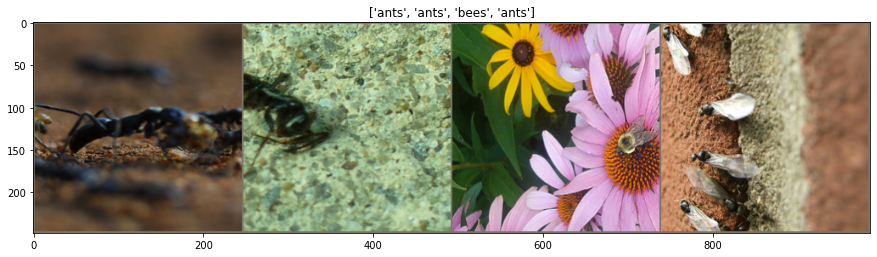

In [7]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(15, 12))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)


# Получим 1 батч (картнки-метки) из обучающей выборки
inputs, classes = next(iter(dataloaders['train']))

# Расположим картинки рядом
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

In [8]:
for i in dataloaders['train']:
    print(i[0][0])
    break

tensor([[[-1.6213, -1.6213, -1.6213,  ...,  1.2899,  1.3070,  1.3070],
         [-1.6042, -1.6213, -1.6384,  ...,  1.2385,  1.2557,  1.2728],
         [-1.5528, -1.6042, -1.6555,  ...,  1.1700,  1.1872,  1.2043],
         ...,
         [-1.9809, -1.9638, -1.9295,  ..., -1.5014, -1.5185, -1.5185],
         [-1.9638, -1.9638, -1.9809,  ..., -1.5699, -1.5699, -1.5699],
         [-1.9467, -1.9638, -1.9980,  ..., -1.6213, -1.6042, -1.6042]],

        [[-1.3354, -1.3880, -1.4405,  ...,  0.9055,  0.8529,  0.7829],
         [-1.3179, -1.3529, -1.4055,  ...,  0.8529,  0.8004,  0.7304],
         [-1.2654, -1.3004, -1.3529,  ...,  0.7829,  0.7304,  0.6429],
         ...,
         [-1.7031, -1.6681, -1.6331,  ..., -1.2129, -1.1779, -1.1604],
         [-1.6681, -1.6331, -1.5980,  ..., -1.2304, -1.1779, -1.1429],
         [-1.6506, -1.6155, -1.5805,  ..., -1.2479, -1.1779, -1.1429]],

        [[-1.1770, -1.2467, -1.3339,  ..., -0.3230, -0.3230, -0.3404],
         [-1.1770, -1.2293, -1.2816,  ..., -0

### Обучение моделей

Следующая функция будет использоваться для обучения модели. Аргументы:  
* model $-$ нейросеть
* loss $-$ оптимизируемая функция (criterion, cost function, objective)
* optimizer $-$ оптимизационный алгоритм
* scheduler $-$ политика изменения learning_rate
* num_epochs $-$ количество итераций обучения

In [9]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25, is_inception=False):
    since = time.time()

    best_model_wts = model.state_dict()
    best_acc = 0.0
    
    losses = {'train': [], 'val': []}

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # каждя эпоха имеет обучающую и тестовую стадии
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train(True)  # установаить модель в режим обучения
            else:
                model.train(False)  # установить модель в режим предсказания

            running_loss = 0.0
            running_corrects = 0

            # итерируемся по батчам
            for data in dataloaders[phase]:
                # получаем картинки и метки
                inputs, labels = data

                # оборачиваем в переменные
                if use_gpu:
                    inputs = inputs.cuda()
                    labels = labels.cuda()
                else:
                    inputs, labels = inputs, labels

                # инициализируем градиенты параметров
                optimizer.zero_grad()

                # forward pass
                # Inception V3 использует и дополнительный выход, который тоже надо переобучать
                if is_inception and phase == 'train':
                    # From https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958
                    outputs, aux_outputs = model(inputs)
                    _, preds = torch.max(outputs.data, 1)
                    loss1 = criterion(outputs, labels)
                    loss2 = criterion(aux_outputs, labels)
                    loss = loss1 + 0.4*loss2
                else:
                    outputs = model(inputs)
                    _, preds = torch.max(outputs.data, 1)
                    loss = criterion(outputs, labels)

                # backward pass + оптимизируем только если это стадия обучения
                if phase == 'train':
                    loss.backward()
                    optimizer.step()
                    scheduler.step()

                # статистика
                running_loss += loss.item()
                running_corrects += int(torch.sum(preds == labels.data))

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects / dataset_sizes[phase]
            
            losses[phase].append(epoch_loss)
            
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # если достиглось лучшее качество, то запомним веса модели
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = model.state_dict()

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # загрузим лучшие веса модели
    model.load_state_dict(best_model_wts)
    return model, losses

* Функция для отрисовки тестовых изображений и предсказаний для них:

In [10]:
def visualize_model(model, num_images=6):
    images_so_far = 0
    fig = plt.figure()

    for i, data in enumerate(dataloaders['val']):
        inputs, labels = data
        if use_gpu:
            inputs, labels = inputs.cuda(), labels.cuda()
        else:
            inputs, labels = inputs, labels

        outputs = model(inputs)
        _, preds = torch.max(outputs.data, 1)

        for j in range(inputs.size()[0]):
            images_so_far += 1
            ax = plt.subplot(num_images // 2, 2, images_so_far)
            ax.axis('off')
            ax.set_title('predicted: {}'.format(class_names[preds[j]]))
            imshow(inputs.cpu().data[j])

            if images_so_far == num_images:
                return

* Функция для измерения точности модели на валидационном датасете

In [11]:
def evaluate(model):
    model.train(False)
    
    runninig_correct = 0
    for data in dataloaders['val']:
        # получаем картинки и метки
        inputs, labels = data
        
        # переносим на gpu, если возможно
        if use_gpu:
            inputs = inputs.cuda()
            labels = labels.cuda()
            
        # forard pass
        output = model(inputs)
        _, predicted = torch.max(output, 1)
        print(torch.sum(predicted == labels))
        
        runninig_correct += int(torch.sum(predicted == labels))
        
    return runninig_correct / dataset_sizes['val']

### AlexNet

Загрузка модели:

In [12]:
model = models.alexnet(pretrained=True)

Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /root/.cache/torch/checkpoints/alexnet-owt-4df8aa71.pth


Посмотрим, что внутри:

In [13]:
model

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

Видим, что на вход классификатору (classifier) подаётся *9216 признаков*. Это и будет размер входа для нашего нового классификатора.

Сконфигурируем - изменим FC-слой и зададим *cost function* и *оптимизирующий алгоритм*:

(*по умолчанию backpropagation распространяется на все слои, поэтому здесь мы только заменяем FC-слой на свой классификатор*)

In [14]:
# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = 9216
# Заменяем Fully-Connected слой на наш линейный классификатор
model.classifier = nn.Linear(num_features, 2)

# Использовать ли GPU
if use_gpu:
    model = model.cuda()

# В качестве cost function используем кросс-энтропию
loss_fn = nn.CrossEntropyLoss()

# В качестве оптимизатора - стохастический градиентный спуск
optimizer_ft = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# Умножает learning_rate на 0.1 каждые 7 эпох (это одна из эвристик, не было на лекциях)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

In [15]:
model, losses = train_model(model, loss_fn, optimizer_ft, exp_lr_scheduler, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.2559 Acc: 0.7090
val Loss: 0.2512 Acc: 0.7516

Epoch 1/24
----------
train Loss: 0.2070 Acc: 0.7377
val Loss: 0.2562 Acc: 0.7516

Epoch 2/24
----------
train Loss: 0.2239 Acc: 0.7172
val Loss: 0.2503 Acc: 0.7516

Epoch 3/24
----------
train Loss: 0.2132 Acc: 0.7541
val Loss: 0.2912 Acc: 0.7516

Epoch 4/24
----------
train Loss: 0.2115 Acc: 0.7500
val Loss: 0.2502 Acc: 0.7516

Epoch 5/24
----------
train Loss: 0.1902 Acc: 0.7828
val Loss: 0.2503 Acc: 0.7516

Epoch 6/24
----------
train Loss: 0.2074 Acc: 0.7418
val Loss: 0.2599 Acc: 0.7516

Epoch 7/24
----------
train Loss: 0.2026 Acc: 0.7541
val Loss: 0.2502 Acc: 0.7516

Epoch 8/24
----------
train Loss: 0.1863 Acc: 0.7746
val Loss: 0.2605 Acc: 0.7516

Epoch 9/24
----------
train Loss: 0.2046 Acc: 0.7787
val Loss: 0.2502 Acc: 0.7516

Epoch 10/24
----------
train Loss: 0.2071 Acc: 0.7541
val Loss: 0.2502 Acc: 0.7516

Epoch 11/24
----------
train Loss: 0.2317 Acc: 0.7459
val Loss: 0.2502 Acc: 0.7516

Ep

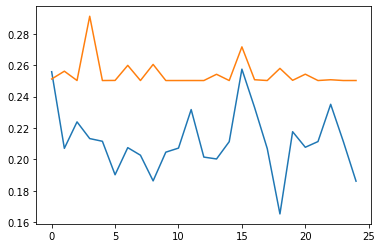

In [16]:
# Построим график лосса при обучении и валидации

plt.plot(losses['train'])
plt.plot(losses['val'])

In [17]:
torch.save(model.state_dict(), 'AlexNet_fine_tune.pth')

In [18]:
model.load_state_dict(torch.load('AlexNet_fine_tune.pth'))

<All keys matched successfully>

In [19]:
print("Accuracy: {0:.4f}".format(evaluate(model)))

tensor(4, device='cuda:0')
tensor(2, device='cuda:0')
tensor(2, device='cuda:0')
tensor(1, device='cuda:0')
tensor(2, device='cuda:0')
tensor(3, device='cuda:0')
tensor(2, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(3, device='cuda:0')
tensor(3, device='cuda:0')
tensor(3, device='cuda:0')
tensor(3, device='cuda:0')
tensor(2, device='cuda:0')
tensor(2, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(3, device='cuda:0')
tensor(1, device='cuda:0')
tensor(4, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(3, device='cuda:0')
tensor(3, device='cuda:0')
tensor(3, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(2, device='cuda:0')
tensor(3, device='cuda:0')
tensor(3, device='cuda:0')
t

Примеры классифицированных изображений

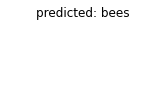

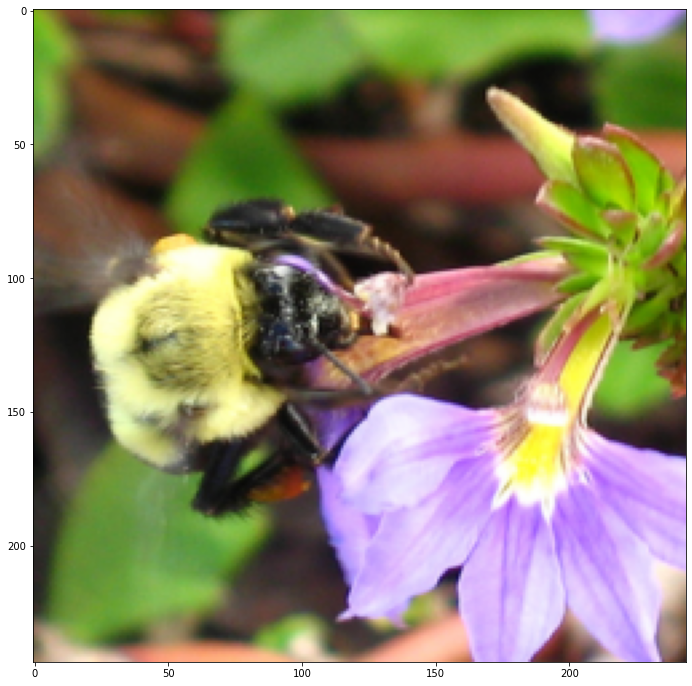

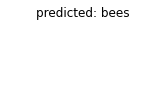

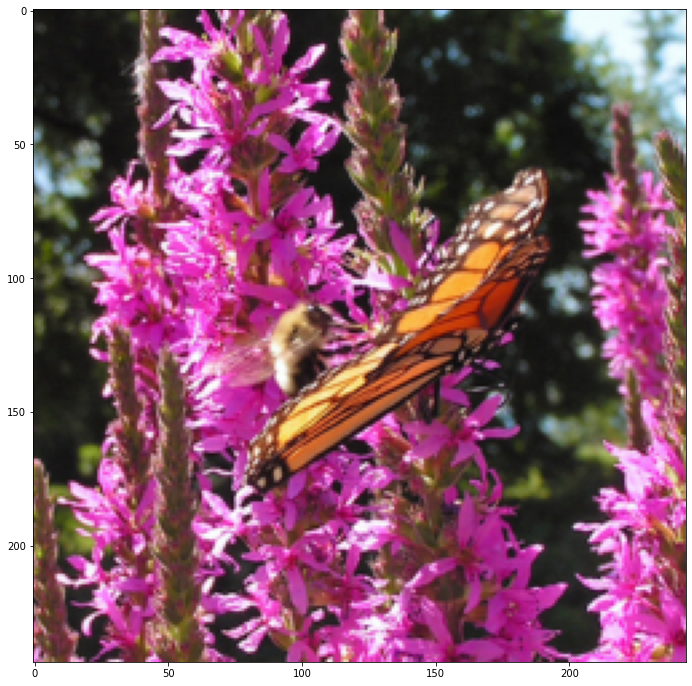

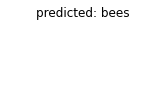

...

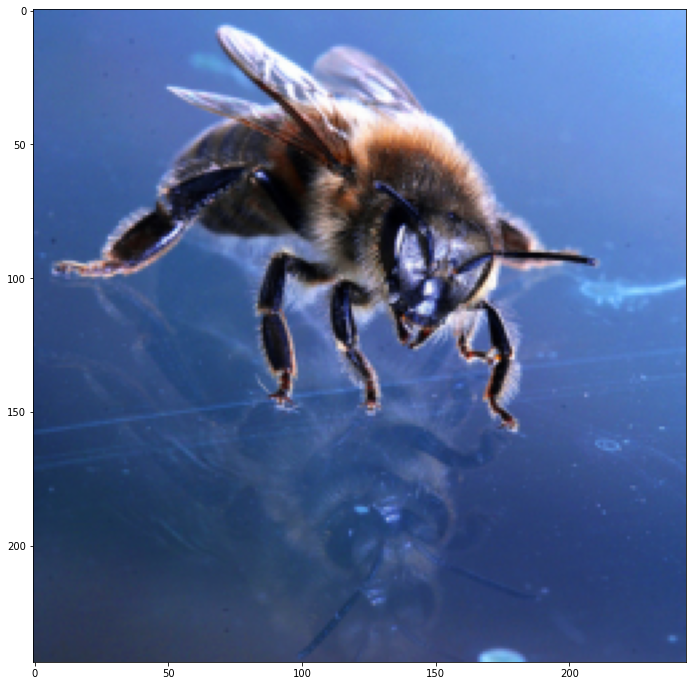

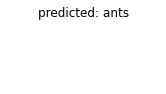

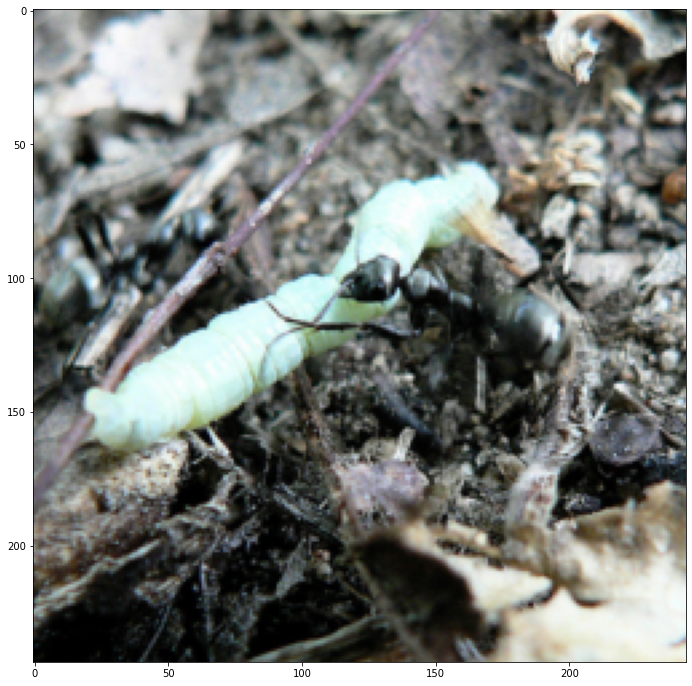

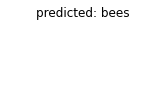

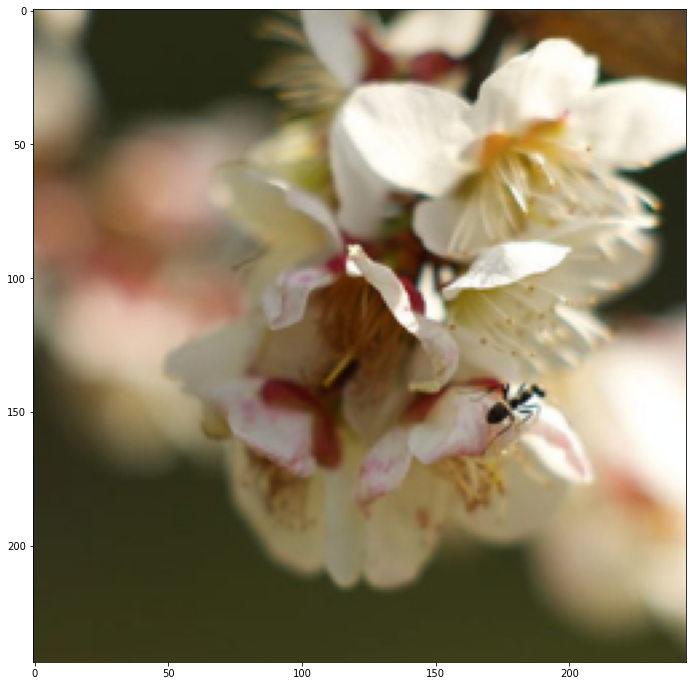

In [20]:
visualize_model(model)

### VGG16

In [21]:
model_extractor = models.vgg16(pretrained=True)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/checkpoints/vgg16-397923af.pth


In [22]:
print(model_extractor)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [23]:
# Количество входов классификатора
num_features = 25088
# Заменяем Fully-Conected слой на наш новый классификатор
model_extractor.classifier = nn.Linear(in_features=num_features, out_features=2)
# Используем ли GPU
if use_gpu:
    model_extractor = model_extractor.cuda()

# Оставим те же параметры, что и в предыдущем примере:

# В качестве cost function используем кросс-энтропию
loss_fn = nn.CrossEntropyLoss()

# В качестве оптимизатора - стохастический градиентный спуск
optimizer_ft = optim.SGD(model_extractor.parameters(), lr=0.001, momentum=0.9)

# Умножает learning_rate на 0.1 каждые 7 эпох (это одна из эвристик, не было на лекциях)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

Дообучим загруженную модель

In [24]:
model_extractor, losses = train_model(model_extractor, loss_fn, optimizer_ft, exp_lr_scheduler, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.1387 Acc: 0.7664
val Loss: 0.0818 Acc: 0.9150

Epoch 1/24
----------
train Loss: 0.0868 Acc: 0.8484
val Loss: 0.0814 Acc: 0.9150

Epoch 2/24
----------
train Loss: 0.0965 Acc: 0.8689
val Loss: 0.0814 Acc: 0.9150

Epoch 3/24
----------
train Loss: 0.0866 Acc: 0.8607
val Loss: 0.0814 Acc: 0.9150

Epoch 4/24
----------
train Loss: 0.0954 Acc: 0.8279
val Loss: 0.1179 Acc: 0.9150

Epoch 5/24
----------
train Loss: 0.0934 Acc: 0.8402
val Loss: 0.0828 Acc: 0.9150

Epoch 6/24
----------
train Loss: 0.0869 Acc: 0.8730
val Loss: 0.0831 Acc: 0.9150

Epoch 7/24
----------
train Loss: 0.0973 Acc: 0.8443
val Loss: 0.0814 Acc: 0.9150

Epoch 8/24
----------
train Loss: 0.1042 Acc: 0.8443
val Loss: 0.1082 Acc: 0.9150

Epoch 9/24
----------
train Loss: 0.1064 Acc: 0.8238
val Loss: 0.0813 Acc: 0.9150

Epoch 10/24
----------
train Loss: 0.1049 Acc: 0.8197
val Loss: 0.0813 Acc: 0.9150

Epoch 11/24
----------
train Loss: 0.0741 Acc: 0.8648
val Loss: 0.0813 Acc: 0.9150

Ep

Построим график функций потерь

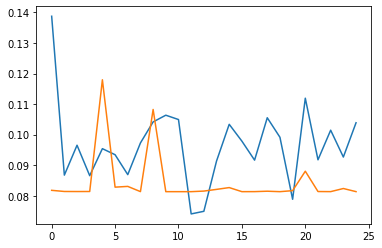

In [25]:
plt.plot(losses['train'])
plt.plot(losses['val'])
plt.show()

Сохраним модель как *VGG16_fine_tune.pth*

In [26]:
torch.save(model_extractor.state_dict(), 'VGG16_fine_tune.pth')

Проверим, что все нормально

In [27]:
model_extractor.load_state_dict(torch.load('VGG16_fine_tune.pth'))

<All keys matched successfully>

Выведем точность модели на валидационном датасете

In [28]:
print("Accuracy: {0:.4f}".format(evaluate(model_extractor)))

tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(3, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(2, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(3, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(3, device='cuda:0')
tensor(3, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
t

Примеры классифицированных изображений

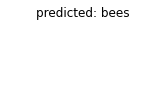

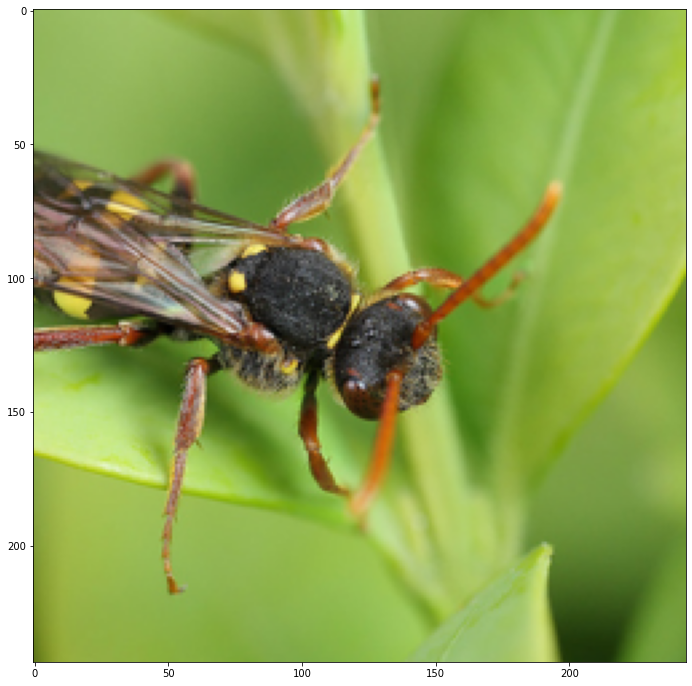

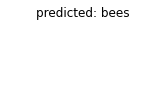

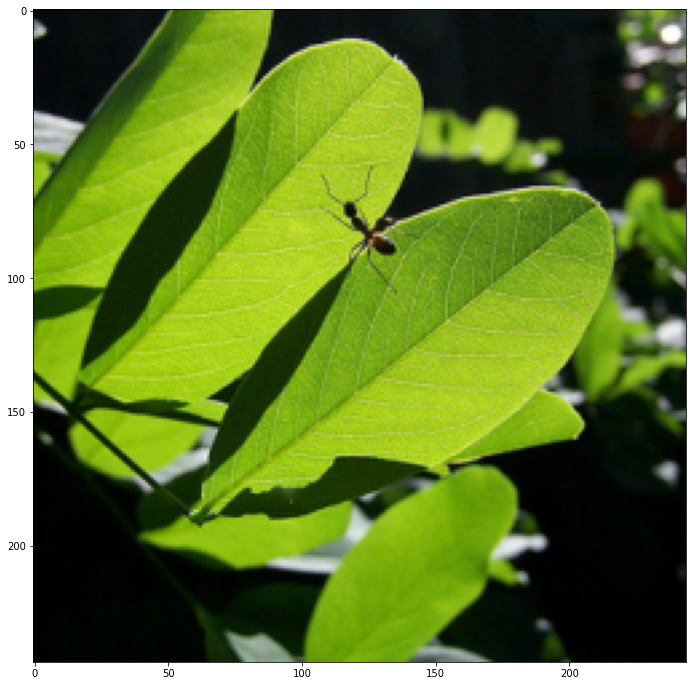

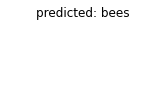

...

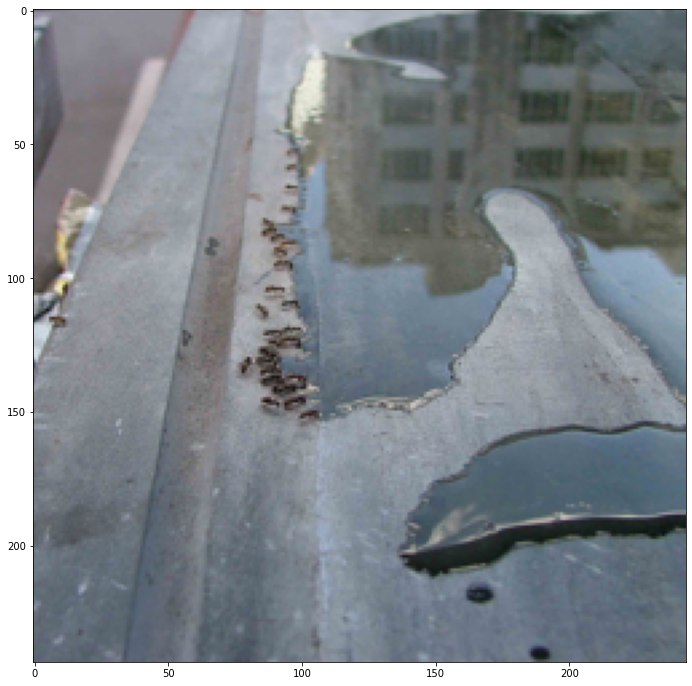

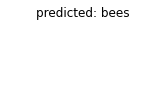

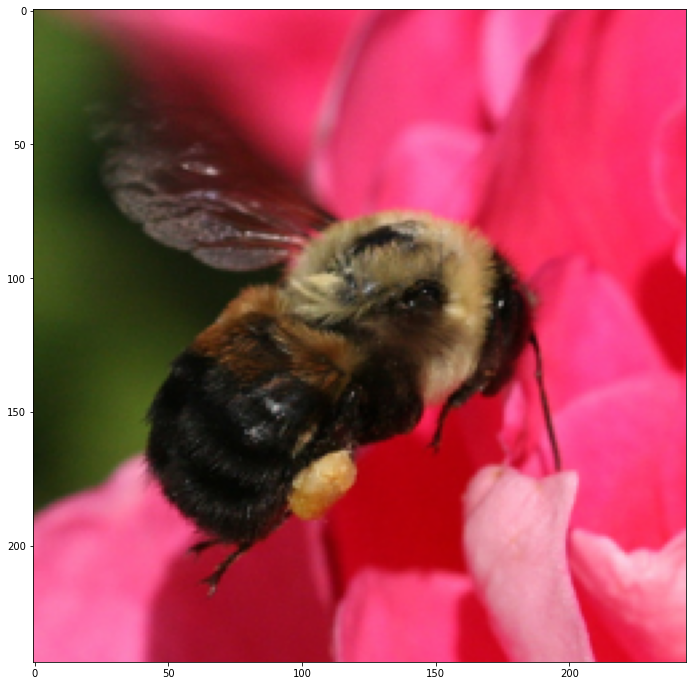

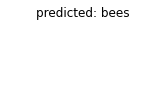

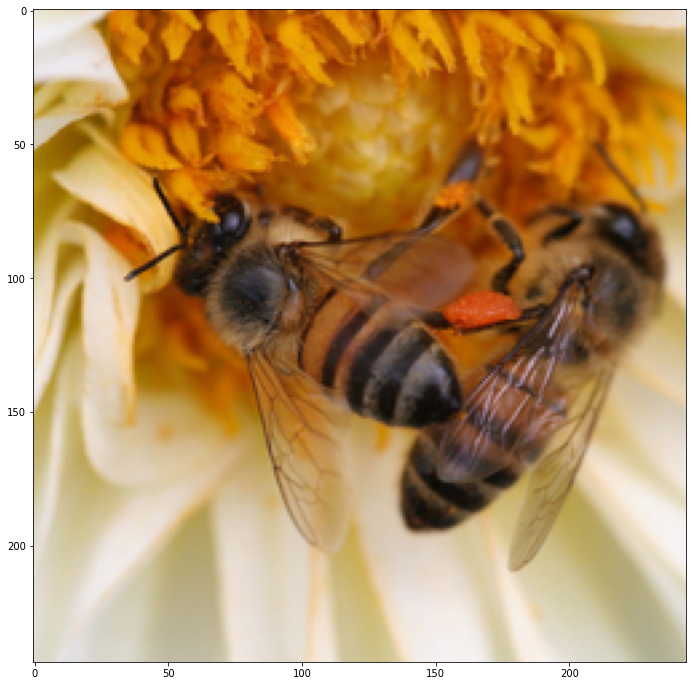

In [29]:
visualize_model(model_extractor)

### Inception_v3

In [30]:
# Нужно поменять размер картинок на 299, иначе будет ошибка, так как размерность станет отрицательной.
# Это вызвано тем, что нейросеть изначально обучалась на картинках размера 299.

# Результирующий размер картинок определяется трансформациями
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(299),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(299),
        transforms.CenterCrop(299),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

# Сам объект датасета
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}

# специальный класс для загрузки данных в виде батчей
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                              shuffle=True, num_workers=4)
               for x in ['train', 'val']}

Выгружаем модель

In [31]:
model_extractor = models.inception_v3(pretrained=True)

Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/checkpoints/inception_v3_google-1a9a5a14.pth


Смотрим, что у модели внутри

In [32]:
print(model_extractor)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, t

Меняем классификатор на свой, задаем параметры для дообучения модели

In [33]:
# Заменяем Fully-Connected слой на наш новый классификатор (здесь он имеет имя 'fc')
model_extractor.fc = nn.Linear(in_features=2048, out_features=2)
# Так же нужно заменить Fully-Connected слой на дополнительном выходе, хоть нас и интересует только главный
model_extractor.AuxLogits.fc = nn.Linear(in_features=768, out_features=2)
# Используем ли GPU
if use_gpu:
    model_extractor = model_extractor.cuda()

# Оставим те же параметры, что и в предыдущем примере:

# В качестве cost function используем кросс-энтропию
loss_fn = nn.CrossEntropyLoss()

# В качестве оптимизатора - стохастический градиентный спуск
optimizer_ft = optim.SGD(model_extractor.parameters(), lr=0.001, momentum=0.9)

# Умножает learning_rate на 0.1 каждые 7 эпох (это одна из эвристик, не было на лекциях)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)

Дообучим загруженную модель

In [34]:
model_extractor, losses = train_model(model_extractor, loss_fn, optimizer_ft, exp_lr_scheduler, num_epochs=25, is_inception=True)

Epoch 0/24
----------
train Loss: 0.2354 Acc: 0.5779
val Loss: 0.1603 Acc: 0.6275

Epoch 1/24
----------
train Loss: 0.2282 Acc: 0.6025
val Loss: 0.1611 Acc: 0.6013

Epoch 2/24
----------
train Loss: 0.2262 Acc: 0.6066
val Loss: 0.1620 Acc: 0.6013

Epoch 3/24
----------
train Loss: 0.2254 Acc: 0.5943
val Loss: 0.1612 Acc: 0.6078

Epoch 4/24
----------
train Loss: 0.2306 Acc: 0.5656
val Loss: 0.1601 Acc: 0.6013

Epoch 5/24
----------
train Loss: 0.2269 Acc: 0.6230
val Loss: 0.1621 Acc: 0.5882

Epoch 6/24
----------
train Loss: 0.2361 Acc: 0.5574
val Loss: 0.1609 Acc: 0.5817

Epoch 7/24
----------
train Loss: 0.2267 Acc: 0.5697
val Loss: 0.1609 Acc: 0.5752

Epoch 8/24
----------
train Loss: 0.2234 Acc: 0.5984
val Loss: 0.1590 Acc: 0.5948

Epoch 9/24
----------
train Loss: 0.2270 Acc: 0.6107
val Loss: 0.1630 Acc: 0.5817

Epoch 10/24
----------
train Loss: 0.2360 Acc: 0.5492
val Loss: 0.1620 Acc: 0.6013

Epoch 11/24
----------
train Loss: 0.2286 Acc: 0.6148
val Loss: 0.1597 Acc: 0.5948

Ep

Построим график функций потерь

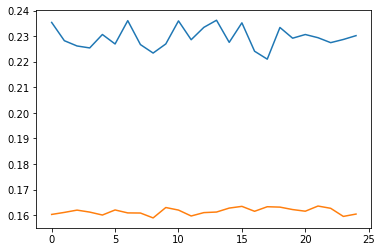

In [35]:
plt.plot(losses['train'])
plt.plot(losses['val'])
plt.show()

Сохраним модель как *Inception3_fine_tune.pth*

In [36]:
torch.save(model_extractor.state_dict(), 'Inception3_fine_tune.pth')

Проверим, что все нормально

In [37]:
model_extractor.load_state_dict(torch.load('Inception3_fine_tune.pth'))

<All keys matched successfully>

Выведем точность модели на валидационном датасете

In [38]:
print("Accuracy: {0:.4f}".format(evaluate(model_extractor)))

tensor(2, device='cuda:0')
tensor(3, device='cuda:0')
tensor(2, device='cuda:0')
tensor(2, device='cuda:0')
tensor(1, device='cuda:0')
tensor(3, device='cuda:0')
tensor(2, device='cuda:0')
tensor(4, device='cuda:0')
tensor(2, device='cuda:0')
tensor(3, device='cuda:0')
tensor(4, device='cuda:0')
tensor(4, device='cuda:0')
tensor(2, device='cuda:0')
tensor(1, device='cuda:0')
tensor(3, device='cuda:0')
tensor(2, device='cuda:0')
tensor(4, device='cuda:0')
tensor(1, device='cuda:0')
tensor(2, device='cuda:0')
tensor(1, device='cuda:0')
tensor(3, device='cuda:0')
tensor(1, device='cuda:0')
tensor(2, device='cuda:0')
tensor(2, device='cuda:0')
tensor(1, device='cuda:0')
tensor(2, device='cuda:0')
tensor(3, device='cuda:0')
tensor(3, device='cuda:0')
tensor(3, device='cuda:0')
tensor(3, device='cuda:0')
tensor(1, device='cuda:0')
tensor(4, device='cuda:0')
tensor(2, device='cuda:0')
tensor(4, device='cuda:0')
tensor(2, device='cuda:0')
tensor(3, device='cuda:0')
tensor(2, device='cuda:0')
t

Примеры классифицированных изображений

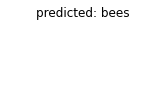

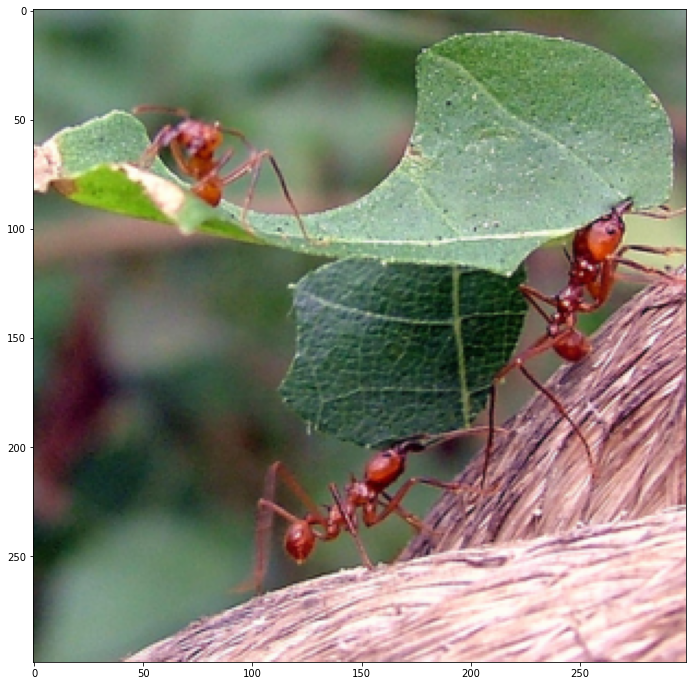

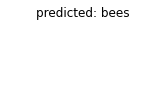

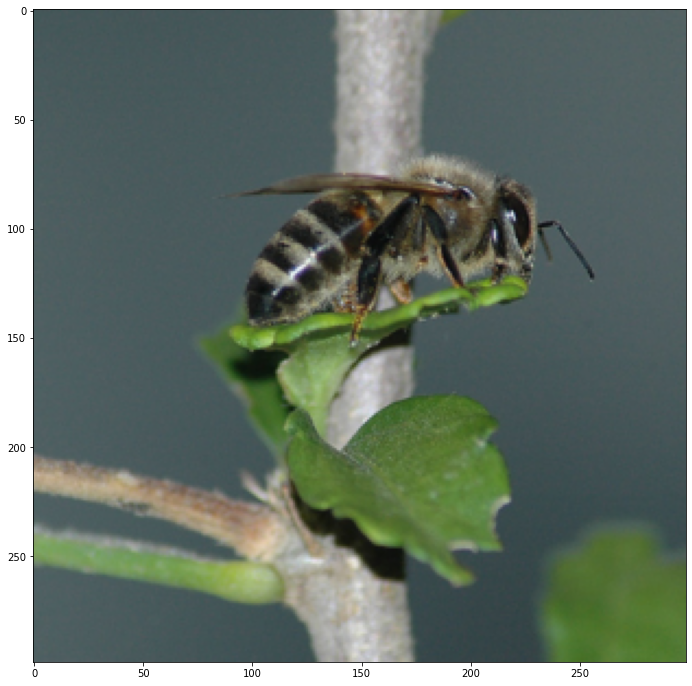

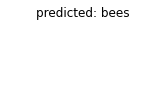

...

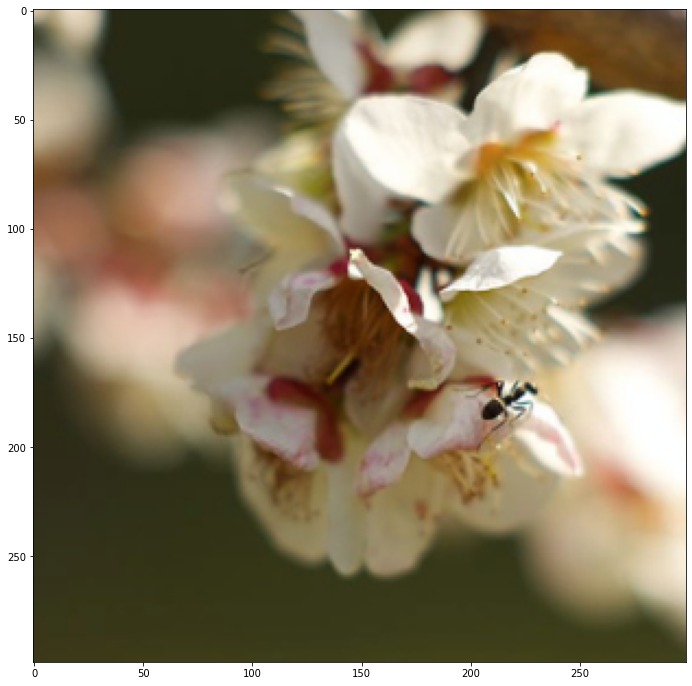

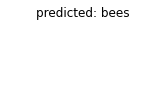

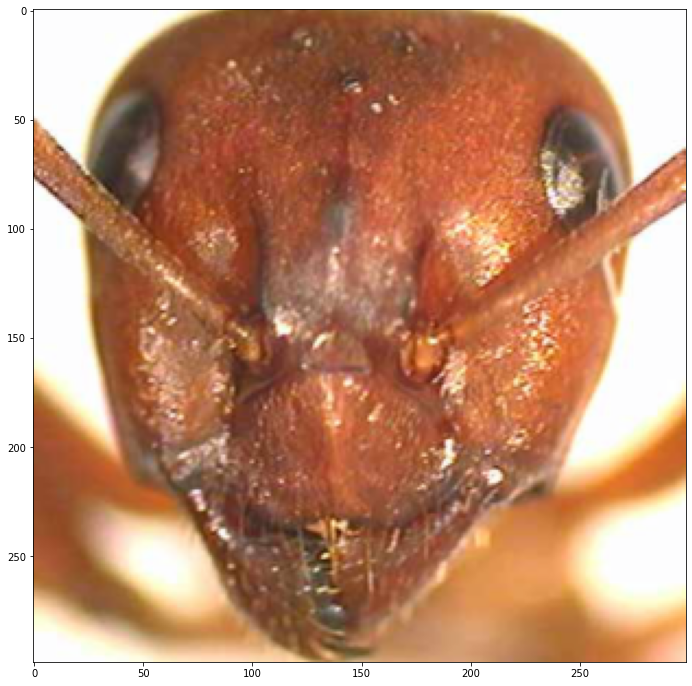

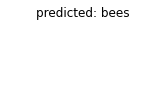

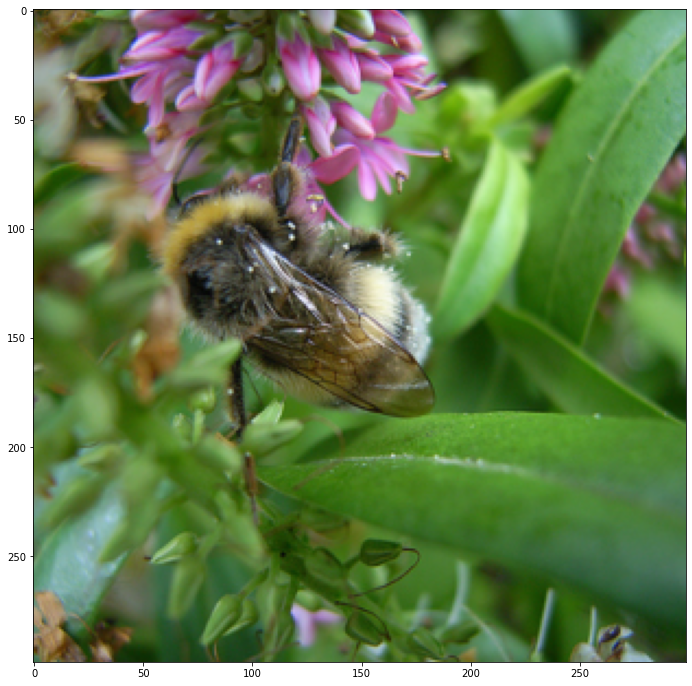

In [39]:
visualize_model(model_extractor)

**Вопрос:** Какая из сетей оказалась наилучшей? Как думаете, почему?

**Ответ:** лучшую точность показала модель VGG16. Удивительно, что самая "навороченная" модель Inception V3 показала наихудшую точность. Видимо эта модель оказалась слишком сложной для такой простой задачи.